## ETL

In [72]:
import pandas as pd
import numpy as np

from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set()
import warnings
warnings.filterwarnings('ignore')

Primero, voy a leer el dataset

In [2]:
df=pd.read_csv('Datasets/AccidentesAviones.csv',index_col=0)

In [3]:
df.head()

,fecha,HORA declarada,Ruta,OperadOR,flight_no,route,ac_type,registration,cn_ln,all_aboard,PASAJEROS A BORDO,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground,summary
0,"September 17, 1908",1718,"Fort Myer, Virginia",Military - U.S. Army,?,Demonstration,Wright Flyer III,?,1,2,1,1,1,1,0,0,"During a demonstration flight, a U.S. Army fly..."
1,"September 07, 1909",?,"Juvisy-sur-Orge, France",?,?,Air show,Wright Byplane,SC1,?,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...
2,"July 12, 1912",0630,"Atlantic City, New Jersey",Military - U.S. Navy,?,Test flight,Dirigible,?,?,5,0,5,5,0,5,0,First U.S. dirigible Akron exploded just offsh...
3,"August 06, 1913",?,"Victoria, British Columbia, Canada",Private,?,?,Curtiss seaplane,?,?,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
4,"September 09, 1913",1830,Over the North Sea,Military - German Navy,?,?,Zeppelin L-1 (airship),?,?,20,?,?,14,?,?,0,The airship flew into a thunderstorm and encou...


Muchas columnas del dataset tienen valores '?', los cuales asumiré que corresponden a valores nulos porque, como vemos a continuación, realmente no hay valores que pandas haya interpretado como NaN. 

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5008 entries, 0 to 5007
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   fecha                   5008 non-null   object
 1   HORA declarada          5008 non-null   object
 2   Ruta                    5008 non-null   object
 3   OperadOR                5008 non-null   object
 4   flight_no               5008 non-null   object
 5   route                   5008 non-null   object
 6   ac_type                 5008 non-null   object
 7   registration            5008 non-null   object
 8   cn_ln                   5008 non-null   object
 9   all_aboard              5008 non-null   object
 10  PASAJEROS A BORDO       5008 non-null   object
 11  crew_aboard             5008 non-null   object
 12  cantidad de fallecidos  5008 non-null   object
 13  passenger_fatalities    5008 non-null   object
 14  crew_fatalities         5008 non-null   object
 15  grou

Ahora, lo primero que haré es reemplazar todos los valores que aparecen como '?' por NaN y luego voy a eliminar las columnas que de entrada creo que no me van a servir para nada: el número del vuelo, registro, cn_ln (que parece ser algun número de serie) y summary, que es una descripción del evento.

In [5]:
df.replace('?',np.nan,inplace=True)

In [6]:
df.drop(columns=['flight_no','registration','cn_ln','summary'],inplace=True)

Ahora, voy a revisar nuevamente la cantidad de valores nulos

In [7]:
df.isna().sum()

fecha                        0
HORA declarada            1504
Ruta                         5
OperadOR                    10
route                      762
ac_type                     13
all_aboard                  17
PASAJEROS A BORDO          221
crew_aboard                219
cantidad de fallecidos       8
passenger_fatalities       235
crew_fatalities            235
ground                      44
dtype: int64

Voy a eliminar los datos nulos de cantidad de fallecidos, ya que me interesa hacer un análisis de la tasa de mortalidad y si hay registros que no tienen ese dato, no me van a ser de mucha utilidad.

In [8]:
df.dropna(subset='cantidad de fallecidos',inplace=True)

In [9]:
df=df.reset_index(drop=True)

Ahora, veo que las columnas estan horriblemente escritas, voy a poner todos esos nombres en minúsculas.

In [10]:
df.columns= df.columns.str.lower()

Tengo un campo de fecha que realmente no me sirve en el análisis porque es un string, así que voy a cambiarle el formato y dejarlo en formato YYYY-MM-DD. Primero, voy a separar los datos por los espacios y los voy a asignar a nuevas columnas en el dataframe.

In [11]:
df[['mes','dia','anio']]=df['fecha'].str.split(' ', expand=True)

Ahora, ya que tengo esto, tengo que cambiar el formato de los días que quedaron con una coma al final. Para estoy voy a reemplazar la coma con un valor vacío.

In [12]:
df['dia']=df.dia.str.replace(',','')

Ahora, en la columna mes voy a reemplazar el mes por el número representativo de cada mes. 

In [13]:
df['mes']=pd.to_datetime(df['mes'], format='%B').dt.month

Ahora asignaré a la columna fecha la combinación de las columnas anio, mes y día y quitaré estas columnas, dejando solo la columna de fecha.

In [14]:
df['fecha']=df['anio'].astype(str)+'-'+df['mes'].astype(str)+'-'+df['dia'].astype(str)

In [15]:
df.drop(columns=['mes','dia','anio'],inplace=True)

In [16]:
df.head()

,fecha,hora declarada,ruta,operador,route,ac_type,all_aboard,pasajeros a bordo,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground
0,1908-9-17,1718,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2,1,1,1,1,0,0
1,1909-9-07,NaN,"Juvisy-sur-Orge, France",NaN,Air show,Wright Byplane,1,0,1,1,0,0,0
2,1912-7-12,0630,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,5,0,5,5,0,5,0
3,1913-8-06,NaN,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,1,0,1,1,0,1,0
4,1913-9-09,1830,Over the North Sea,Military - German Navy,NaN,Zeppelin L-1 (airship),20,NaN,NaN,14,NaN,NaN,0


In [17]:
df.isna().sum()

fecha                        0
hora declarada            1496
ruta                         5
operador                    10
route                      755
ac_type                     11
all_aboard                   9
pasajeros a bordo          213
crew_aboard                211
cantidad de fallecidos       0
passenger_fatalities       227
crew_fatalities            227
ground                      36
dtype: int64

Ahora, para mi análisis quisiera revisar solo los vuelos que tuvieron fatalidades, así que voy a eliminar los registros que no tienen fatalidades. 

In [18]:
df[df['cantidad de fallecidos']=='0']

,fecha,hora declarada,ruta,operador,route,ac_type,all_aboard,pasajeros a bordo,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground
30,1919-10-20,NaN,"English Channel off Forkstone, Kent",Aircraft Transport and Travel,NaN,De Havilland DH-4,0,0,1,0,0,0,0
116,1926-10-21,c 13:15,English Channel,Imperial Airways,Croydon - Paris,Handley Page W-10,12,10,2,0,0,0,0
119,1927-1-12,NaN,"Estaires, France",Fokker,Delivery flight,Fokker F-VII,0,0,2,0,0,2,0
288,1932-8-12,NaN,"Beyrouth, Lebanon",Air Orient,Marseille - Naples - Beyrouth - Saigon,CAMS 53,7,3,4,0,0,0,0
322,1933-11-10,NaN,"Moriarty, New Mexico",Trans Continental and Western Air,NaN,Northrop Delta,1,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4700,2008-12-20,1818,"Denver, Colorado",Continental Airlines,Denver - Houston,Boeing 737-500,115,110,5,0,0,0,0
4704,2009-1-15,1506,"New York, New York",US Airways,"New York, NY- Charlotte, NC",Airbus A320-214,155,150,5,0,0,0,0
4831,2012-6-02,1530,"Accra, Ghana",Allied Air,"Lagos, Nigerai - Accra, Ghana",Boeing B-727-200,4,0,4,0,0,4,12
4855,2013-4-13,1535,"Denpasar, Indonesia",Lion Air,Bandung - Denpasar,Boeing B-737-8GP,108,101,7,0,0,0,0


In [19]:
df=df[df['cantidad de fallecidos']!='0']

In [20]:
df=df.reset_index(drop=True)

Ahora, me di cuenta mirando los vuelos que no tuvieron fatalidades que la columna route parece no tener informacion consistente, unos valores parecen ser el tipo de vuelo que se estaba haciendo y otros el destino al que queria llegar el vuelo, quiero revisar esto mas a fondo. 

In [21]:
df['route']

0                      Demonstration
1                           Air show
2                        Test flight
3                                NaN
4                                NaN
                    ...             
4919             Sightseeing Charter
4920                             NaN
4921            Naypyidaw - Anisakan
4922    Cagayan de Oro-Lumbia - Jolo
4923          Petropavlovsk - Palana
Name: route, Length: 4924, dtype: object

Lo ultimo que veo, son nombres de ciudades y al comienzo el tipo de vuelo, voy a eliminar esta columna porque me parece inconsistente.

In [22]:
df.drop(columns='route',inplace=True)

In [23]:
df.head()

,fecha,hora declarada,ruta,operador,ac_type,all_aboard,pasajeros a bordo,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground
0,1908-9-17,1718,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2,1,1,1,1,0,0
1,1909-9-07,NaN,"Juvisy-sur-Orge, France",NaN,Wright Byplane,1,0,1,1,0,0,0
2,1912-7-12,0630,"Atlantic City, New Jersey",Military - U.S. Navy,Dirigible,5,0,5,5,0,5,0
3,1913-8-06,NaN,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1,0,1,1,0,1,0
4,1913-9-09,1830,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20,NaN,NaN,14,NaN,NaN,0


Veo que la columna hora declarada tampoco tiene un formato uniforme, voy a normalizarla poniendo todos los valores como 4 numeros consecutivos. Como se que los datos estan en formato string, voy a filtrar los datos por los que tienen mas de 4 caracteres y usar replace para reemplazar por vacios los caracteres que no quiero.

In [24]:
df[df['hora declarada'].str.len()>4]

,fecha,hora declarada,ruta,operador,ac_type,all_aboard,pasajeros a bordo,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground
83,1923-9-14,c 18:00,"Near Ivinghoe, Buckinghamshire, England",Daimler Airways,de Havilland DH-34,5,3,2,5,3,2,0
86,1923-12-23,c 02:30,Over the Mediterranean Sea,Military - French Navy,Zeppelin Dixmunde (airship),52,NaN,NaN,52,NaN,NaN,0
94,1924-12-24,c 12:00,"Purley, England",Imperial Airways,de Havilland DH-34B,8,7,1,8,7,1,0
128,1927-9-23,10:00,"Schleiz, Germany",Deutsche Lufthansa,Dornier Merkur,6,4,2,6,4,2,0
152,1928-7-24,14:48,"Waalhaven, Netherlands",KLM Royal Dutch Airlines,Fokker (KLM) F.III,6,5,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4310,2002-2-22,02:30,"Off Dumaguete, Philippines",Military - U.S. Army,MH-47 Chinook helicopter,10,4,6,10,4,6,0
4315,2002-4-15,11:23,"Busan, South Korea",Air China,Boeing B-767-200ER,166,155,11,128,120,8,0
4460,2004-12-11,05:30,"Uberaba, Brazil",NHR Táxi-Aéreo,Embraer EMB-110 Bandeirante,2,0,2,2,0,2,1
4661,2009-8-26,0500Z,"Nganga Lingolo, Congo",Aero Fret Business,Antonov An-12BK,7,2,5,7,2,5,0


In [25]:
df['hora declarada']=df['hora declarada'].str.replace(':','')

In [26]:
df['hora declarada']=df['hora declarada'].str.replace('c','')

Estos datos a los que le quite la c tienen un espacio antes de la hora, se lo quitare con la funcion strip.

In [27]:
df['hora declarada']=df['hora declarada'].str.strip()

Reviso nuevamente que datos me quedan por normalizar.

In [28]:
df[df['hora declarada'].str.len()>4]

,fecha,hora declarada,ruta,operador,ac_type,all_aboard,pasajeros a bordo,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground
860,1946-8-20,06;15,"Rouen, France",British Overseas Airways,Avro 691 Lancastrian 1,9,0,9,8,0,8,0
905,1946-12-28,0209Z,"Near Shannon, Ireland",Trans Continental and Western Air,Lockheed 049 Consellation,23,14,9,13,9,4,0
1096,1949-7-12,0350Z,"Near Bombay, India",KLM Royal Dutch Airlines,Lockheed L-749-79-33 Constellation,45,34,11,45,34,11,0
1281,1952-2-16,1734Z,"Near Burgio, Italy",Hunting Air Travel,Vickers 614 Viking 1,31,26,5,31,26,5,0
1313,1952-8-21,0100Z,"Off Trapani, Italy",Airwork,Handley Page HP-81 Hermes 4A,57,51,6,7,1,6,0
4661,2009-8-26,0500Z,"Nganga Lingolo, Congo",Aero Fret Business,Antonov An-12BK,7,2,5,7,2,5,0


In [29]:
df['hora declarada']=df['hora declarada'].str.replace('Z','')

In [30]:
df['hora declarada']=df['hora declarada'].str.replace(';','')

Compruebo que no queden datos por normalizar y cuento nuevamente cuantos valores nulos hay para tener en cuenta cuando convierta a formato hora que no me aparezcan mas valores nulos.

In [31]:
df[df['hora declarada'].str.len()>4]

,fecha,hora declarada,ruta,operador,ac_type,all_aboard,pasajeros a bordo,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground


In [32]:
df['hora declarada'].isna().sum()

1479

Ahora, para comparar valores, voy a poner en una nueva columna auxiliar la hora con el formato de tiempo por si me aparecen mas valores NaN cuando convierta.

In [33]:
df['hora']=pd.to_datetime(df['hora declarada'], format='%H%M').dt.time

In [34]:
df.hora.isna().sum()

1479

Me dio el mismo numero asi que la transformacion fue satisfactoria. Voy a reasignar a la columna hora declarada los valores de la columna auxiliar hora y despues la eliminaré. 

In [35]:
df['hora declarada']=df['hora']
df.drop(columns=['hora'],inplace=True)

In [36]:
df.head()

,fecha,hora declarada,ruta,operador,ac_type,all_aboard,pasajeros a bordo,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground
0,1908-9-17,17:18:00,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2,1,1,1,1,0,0
1,1909-9-07,NaT,"Juvisy-sur-Orge, France",NaN,Wright Byplane,1,0,1,1,0,0,0
2,1912-7-12,06:30:00,"Atlantic City, New Jersey",Military - U.S. Navy,Dirigible,5,0,5,5,0,5,0
3,1913-8-06,NaT,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1,0,1,1,0,1,0
4,1913-9-09,18:30:00,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20,NaN,NaN,14,NaN,NaN,0


In [37]:
df.isna().sum()

fecha                        0
hora declarada            1479
ruta                         5
operador                    10
ac_type                     11
all_aboard                   9
pasajeros a bordo          212
crew_aboard                210
cantidad de fallecidos       0
passenger_fatalities       225
crew_fatalities            225
ground                      36
dtype: int64

Ahora, tampoco puedo calcular la tasa de mortalidad si no se cuantas personas iban a bordo en total, voy a revisar los registros de esta columna que aparecen como NaN.

In [38]:
df[df.all_aboard.isna()]

,fecha,hora declarada,ruta,operador,ac_type,all_aboard,pasajeros a bordo,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground
26,1919-7-21,16:55:00,"Chicago, Illinois",Wingfoot Air Express Goodyear Tire,FD Type Dirigible,NaN,NaN,NaN,3,2,1,10
1204,1951-1-20,NaT,"Huilyo, Peru",Military - TAM,Douglas DC-3,NaN,NaN,NaN,16,NaN,NaN,NaN
1335,1952-12-22,NaT,"Damascus, Syria",Syrian Air,Douglas DC-3,NaN,NaN,NaN,9,NaN,NaN,NaN
1359,1953-4-10,NaT,"Near Anchieta Island, Brazil",REAL,Doublas Dc-3,NaN,NaN,NaN,26,NaN,NaN,NaN
1547,1956-6-13,NaT,Over North Carolina,Piedmont,Douglas DC-3,NaN,NaN,NaN,1,1,NaN,0
1595,1957-4-20,NaT,"Jirkouk, Iraq",Air France,Lockheed Super Constellation,NaN,NaN,NaN,1,1,0,0
1606,1957-6-24,NaT,"Horn Island, Queensland, Australia",Adastra Airways,L-Hudson,NaN,NaN,NaN,6,NaN,NaN,NaN
3497,1989-5-09,NaT,"Near Tainjin, China",Aero Asahi,Bell 412,NaN,NaN,NaN,10,NaN,NaN,0
3693,1992-2-20,NaT,En route from Argentina to California,Aerolineas Argentinas,Boeing B-747,NaN,NaN,NaN,1,NaN,NaN,0


Realmente no tengo manera de saber cuantas personas en total iban a bordo asi que voy a eliminar estos registros. 

In [39]:
df.dropna(subset='all_aboard',inplace=True)

In [40]:
df=df.reset_index(drop=True)

In [41]:
df['fecha']=pd.to_datetime(df['fecha'],format='%Y-%m-%d',errors='coerce')

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4915 entries, 0 to 4914
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   fecha                   4915 non-null   datetime64[ns]
 1   hora declarada          3444 non-null   object        
 2   ruta                    4910 non-null   object        
 3   operador                4905 non-null   object        
 4   ac_type                 4904 non-null   object        
 5   all_aboard              4915 non-null   object        
 6   pasajeros a bordo       4712 non-null   object        
 7   crew_aboard             4714 non-null   object        
 8   cantidad de fallecidos  4915 non-null   object        
 9   passenger_fatalities    4696 non-null   object        
 10  crew_fatalities         4697 non-null   object        
 11  ground                  4883 non-null   object        
dtypes: datetime64[ns](1), object(11)
memory usage: 4

Voy a renombrar las columnas para que queden todas en español.

In [43]:
df.rename(columns={'ac_type':'tipo_aeronave', 'hora declarada':'hora_declarada','all_aboard':'total_abordo',
                   'pasajeros a bordo':'pasajeros_abordo','crew_aboard': 'tripulacion_abordo', 'cantidad de fallecidos':'total_fatalidades',
                   'passenger_fatalities':'pasajeros_fatalidades', 'crew_fatalities':'tripulacion_fatalidades', 'ground':'tierra_fatalidades'
}, inplace=True)

In [44]:
df.isna().sum()

fecha                         0
hora_declarada             1471
ruta                          5
operador                     10
tipo_aeronave                11
total_abordo                  0
pasajeros_abordo            203
tripulacion_abordo          201
total_fatalidades             0
pasajeros_fatalidades       219
tripulacion_fatalidades     218
tierra_fatalidades           32
dtype: int64

## EDA

Para efectos del análisis voy a agregar una columna auxiliar con el año del accidente.

In [45]:
df['anio']=df['fecha'].dt.year

In [46]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

ANÁLISIS DEL REPORTE

columna: fecha 


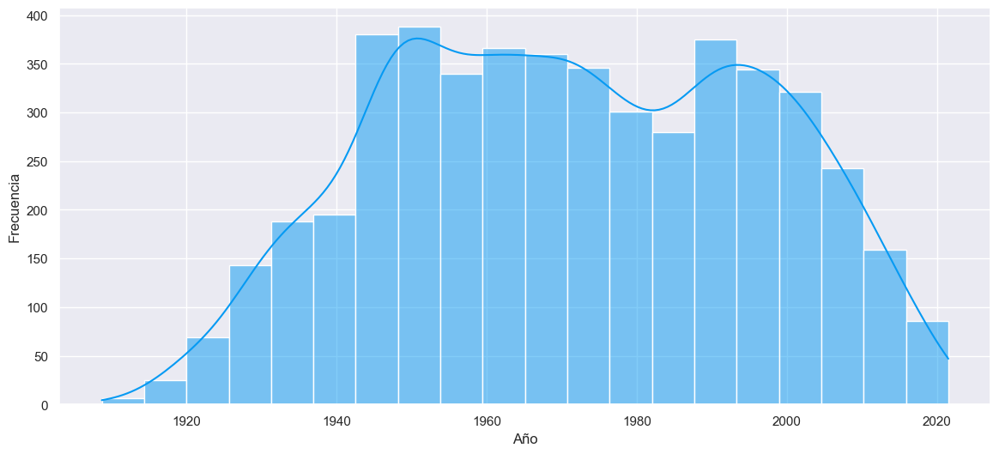

In [164]:
plt.figure(figsize=(14, 6))
sns.histplot(data=df, x='fecha', bins=20, color='xkcd:azure',kde=True)
plt.xlabel('Año')
plt.ylabel('Frecuencia')
plt.show()

Según el reporte y esta gráfica, vemos que despues de 1940 y antes de los 2000, tenemos la mayor concentración de accidentes aereos con fatalidades. Según el reporte, en este dataset, el top 10 de años con más accidentes fatales fueron todos antes de 1995, teniendo el pico máximo en el año 1946. Esto, en teoria tiene sentido si tenemos en cuenta que la aviación comercial se empezó a dar alrededor del año 1914(cita1) y creció notoriamente en popularidad a partir los años 50(cita2). Esto significa que alrededor de las fechas donde tenemos nuestros máximos, habian más aeronaves volando con pasajeros a bordo que en los años previos. Sumandole a esto, es conocido que la primera generación de jets(1952 hasta 1964) tenian una alta tasa de accidentalidad, en gran parte porque las prácticas de mantenimiento para las aeronaves eran inadecuadas. De aquí, que desde 1960 se desarrollara una investigación exhaustiva para mejorar esta situación, en cabeza de United Airlines y respaldada por el departamento de defensa de Estados Unidos, la cual en 1978 dio sus frutos generando los nuevos estandares de mantenimiento que se debian seguir en la aviación para garantizar la confiabilidad de las maquinas(hasta hoy en día este estandar se mantiene y se ha convertido en el estandar de mantenimiento para muchos otros sectores más internacionalmente)(cita3). La aplicación de esta nueva metodología fue exitosa en disminuir los niveles de accidentalidad en los años siguientes, cuando finalmente se vuelve un estandar internacional y se empieza a usar ampliamente. 

columnas: ruta y operador

Para esta columna, segun el reporte, la mayor cantidad de accidentes se han dado en la ruta a Moscú, Rusia. Adelantandome un poco, esto tiene sentido con la columna operador, ya que la mayor cantidad de accidentes aereos en este dataset corresponden a Aeroflot, una aerolinea rusa que fue fundada en 1923 (cita4). Según las estadisticas, Aeroflot ha tenido cinco veces más accidentes que cualquier otra aerolinea, sobretodo en el tiempo de la unión sovietica. En este dataset, hay mas accidentes registrados para Aeroflot que para las fuerzas aereas de cualquier pais incluido.

Ahora, me interesa revisar el numero de accidentes de los vuelos civiles vs militares

In [106]:
df_tflight=df[df.operador.notna()]
df_tflight=df_tflight.reset_index(drop=True)


In [109]:
df_military=df_tflight[df_tflight['operador'].str.contains('Military', regex=False)]
df_military.shape[0]

753

In [124]:
df_civil=df_tflight[~df_tflight['operador'].str.contains('Military', regex=False)]
df_civil.shape[0]

4152

In [127]:
cuentac=df_civil['anio'].value_counts().reset_index()
cuentac=cuentac.sort_values('index')

In [128]:
cuentam=df_military['anio'].value_counts().reset_index()
cuentam=cuentam.sort_values('index')

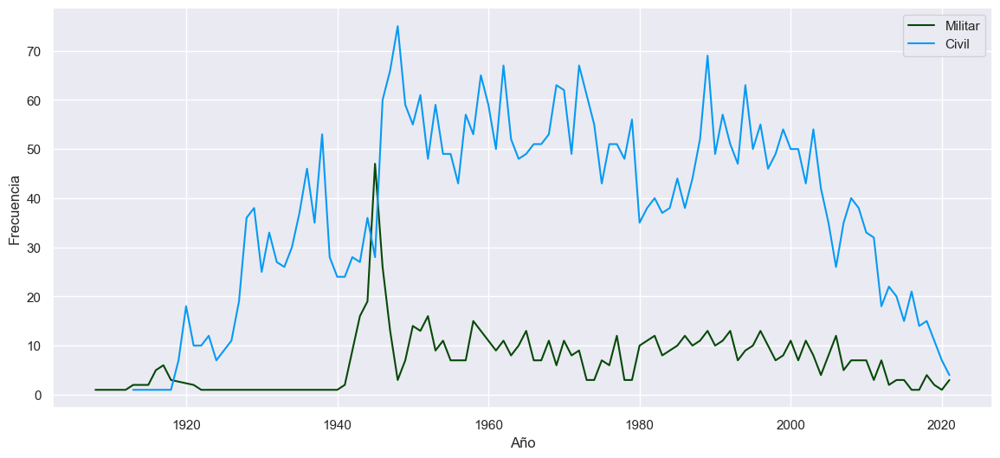

In [161]:

plt.figure(figsize=(14, 6))
sns.lineplot(data=cuentam, x='index', y='anio', color='xkcd:darkgreen',label='Militar')
sns.lineplot(data=cuentac, x='index', y='anio',color='xkcd:azure',label='Civil')
plt.xlabel('Año')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

Como podemos apreciar la gráfica anterior, en los tiempos donde se vivieron la primera y segunda guerra mundial, los accidentes aéreos militares aumentaron y superaron los accidentes civiles, lo cual tiene total sentido, teniendo en cuenta que las fuerzas aéreas jugaron un papel de suma importancia en ambos conflictos. Justo después del pico que corresponde a los años de la segunda guerra mundial, vemos un aumento significativo en accidentes civiles, lo cual concuerda con la época en la que las aerolineas comerciales se comenzaron a volver más populares y los tiquetes más económicos.

columna: tipo_aeronave

El modelo Douglas DC-3 parece ser el que más ha tenido accidentes historicamente, este modelo tuvo un alto impacto en la industria aérea durante las decadas de 1930, 1940 y la segunda guerra mundial (cita). Estos aviones fueron adoptados tanto por industría aérea civíl como por la militar y se adaptaron varias versiones dependiendo el uso. Esto concuerda con las gráficas analizadas anteriormente, donde se pudo evidenciar una alta incidencia de accidentes después de 1940. Cabe resaltar que este tipo de aviones ya no son tan comúnes, no se siguen produciendo y los pocos que quedan, suelen ser usados como aviones de carga. Este también es el caso para los aviones que se encuentran en el top 10 de accidentes de este dataset, la mayoría son modelos viejos, pequeños y fabricados por la Douglas Aircraft Company, que tuvieron su mayor impacto en tiempos de guerra y desarrollo principal de la aviación comercial. Es tanto así que esta compañia actualmente no existe, ya que se fusionó en 1967 con McDonnell Aircraft y luego, en 1997 con Boeing, razón por la cual el logo de Boeing que conocemos actualmente es el mismo que solía tener Douglas.

columna: total_abordo

Teniendo en cuenta el reporte, la información es concluyente con lo que observamos en la columna anterior, la mayoría de accidentes en este dataset corresponden a modelos viejos que eran significativamente pequeños en comparación a los aviones comerciales que conocemos hoy en día, por lo tanto, tenemos que la mayor cantidad de accidentes tenían pocas personas a bordo. 

columna: pasajeros_abordo

Según el reporte, el valor más común de pasajeros a bordo es 0, esto se puede explicar porque no todos accidentes registrados aquí son de aviones comerciales. Seguido al 0, podemos ver que los otros registros más comunes en el top 10 no superan 10 pasajeros. Esto es consecuente con la información anteriormente registrada. 

columna: tripulacion_abordo

Los números de personas pertenecientes a la tripulación más comunes se encuentran entre 3 y 5, lo cual diría que es lo usual para varios sectores de la indutría aérea. 

In [149]:
df['tripulacion_abordo']=df['tripulacion_abordo'].astype('float')

Quiero revisar los valores atípicos de esta categoría, que los tomaré como los que estan por encima de 25, que según el reporte son los valores más grandes. 

In [159]:
df[df['tripulacion_abordo']>25]

,fecha,hora_declarada,ruta,operador,tipo_aeronave,total_abordo,pasajeros_abordo,tripulacion_abordo,total_fatalidades,pasajeros_fatalidades,tripulacion_fatalidades,tierra_fatalidades,anio
6,1915-03-05,01:00:00,"Tienen, Belgium",Military - German Navy,Zeppelin L-8 (airship),41,0,41.0,17,0,17,0,1915
58,1921-08-24,17:40:00,"River Humber, England",Military - Royal Airship Works,Royal Airship Works ZR-2 (airship),49,0,49.0,43,0,43,1,1921
100,1925-09-03,05:30:00,"Caldwell, Ohio",Military - U.S. Navy,Dirigible ZR-1 Shenandoah (airship),43,0,43.0,14,0,14,0,1925
355,1935-02-12,NaT,"Off Point Sur, Californiia",Military - US Navy,Goodyear-Zeppelin U.S.S. Macon (airship),83,0,83.0,2,0,2,0,1935
447,1937-05-06,19:25:00,"Lakehurst, New Jersey",Deutsche Zeppelin Reederei,Zeppelin LZ-129,97,36,61.0,35,13,22,1,1937
2423,1970-03-16,11:30:00,"Near Da Nang, South Vietnam",Military - U.S. Navy,Lockheed EC-121P,31,0,31.0,23,0,23,0,1970
2851,1977-03-27,17:07:00,"Tenerife, Canary Islands",Pan American World Airways / KLM,Boeing B-747-121 / Boeing B-747-206B,644,614,30.0,583,560,23,0,1977
2976,1979-06-07,11:00:00,"Near Leh, India",Military - Indian Air Force,Hindustan Aeronautics 748-2M,27,0,27.0,27,0,27,0,1979
3984,1996-11-12,18:40:00,"Near Charkhi Dadri, India",Saudi Arabian Airlines / Kazakhstan Airlines,Boeing B-747-168B / Ilyushin IL-76TD,349,316,33.0,349,316,33,0,1996


Como se puede apreciar, estos valores corresponden en su mayoría a Zeppelins militares en los que todos a bordo son considerados tripulación y los que son civiles, son vuelos comerciales en los que hubo colisión en el aire de dos aviones así que se suman los valores de ambos. 

columnas: total_fatalidades y tierra_fatalidades 


In [170]:
df['total_fatalidades']=df['total_fatalidades'].astype('int')
df['tierra_fatalidades']=df['tierra_fatalidades'].astype('float')

In [168]:
fat_abordo_anio=df.groupby('anio')['total_fatalidades'].sum().reset_index()

In [171]:
fat_tierra_anio=df.groupby('anio')['tierra_fatalidades'].sum().reset_index()

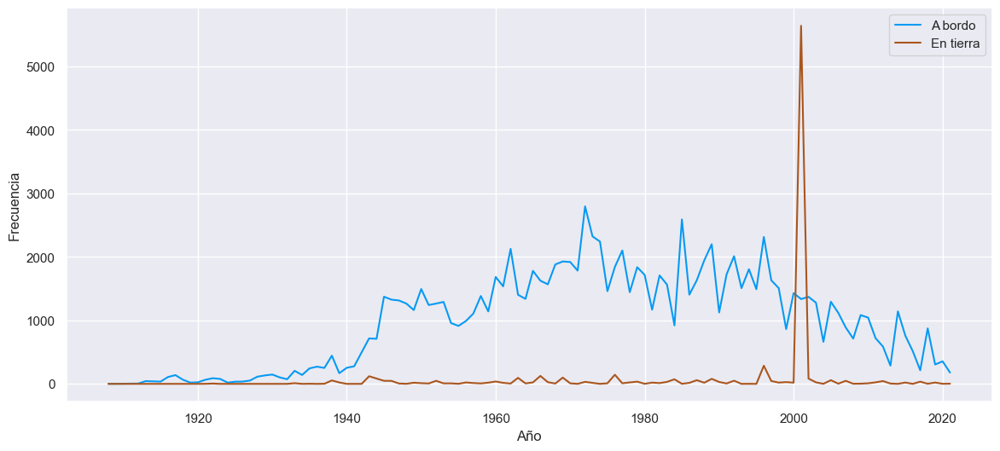

In [177]:
plt.figure(figsize=(14, 6))
sns.lineplot(data=fat_abordo_anio, x='anio', y='total_fatalidades', color='xkcd:azure',label='A bordo')
sns.lineplot(data=fat_tierra_anio, x='anio', y='tierra_fatalidades',color='xkcd:sienna',label='En tierra')
plt.xlabel('Año')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

Como vemos en esta gráfica, realmente es raro que haya mucho muertos en tierra cuando un avión se accidenta,sin embargo, podemos ver que hay un pico de fatalidades en tierra en el año 2001, esto corresponde al ataque terrorista al World Trade Center (9/11), en el cual dos aviones chocaron contra sus dos torres, las cuales estaban llenas de personas en la ciudad de Nueva York. A continuación el detalle de estos valores atípicos.

In [179]:
df[df['tierra_fatalidades']>2000]

,fecha,hora_declarada,ruta,operador,tipo_aeronave,total_abordo,pasajeros_abordo,tripulacion_abordo,total_fatalidades,pasajeros_fatalidades,tripulacion_fatalidades,tierra_fatalidades,anio
4267,2001-09-11,08:47:00,"New York City, New York",American Airlines,Boeing 767-223ER,92,81,11.0,92,81,11,2750.0,2001
4268,2001-09-11,09:03:00,"New York City, New York",United Air Lines,Boeing B-767-222,65,56,9.0,65,56,9,2750.0,2001


Segun el reporte, para este dataset, el valor mas comun de fatalidades es 1 y en el top 10 le siguen valores en el rango de 2 a 13. Esto es congruente con las conclusiones que se extrajeron previamente de las otras columnas. 

In [189]:
fat_abordo_anio[fat_abordo_anio['total_fatalidades']>2600]

,anio,total_fatalidades
61,1972,2796


El año con mayor número de fatalidades parece ser 1972, lo cual tiene sentido porque en 1972 ya estaba operando la nueva generación de jets, que hasta el día de hoy siguen en uso y en producción, como el Boeing 737. Estos aviones son mucho más grandes que los de la primera generación y admiten muchos más pasajeros, por ende, en el caso de accidentes, lo más probable es que haya una mayor tasa de mortalidad, aunque no necesariamente haya una mayor tasa de accidentalidad. De hecho, según la literatura, la tasa de accidentes fatales por millón de vuelos de 3 para la primera generación de jets, cayó a un 0.9 para la segunda generación y ha seguido cayendo para las generaciones siguientes(cita).